In [1]:
here::i_am("atac/chrombpnet/plot_finemo.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

library(ggseqlogo)
library(rhdf5)
library(XML)


here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/code

Warning message:
“package ‘ggseqlogo’ was built under R version 4.2.3”
Warning message:
“package ‘rhdf5’ was built under R version 4.2.3”


In [2]:
read_modisco_report = function(modisco_file){
    html_content <- paste(readLines(modisco_file, warn = FALSE), collapse = "\n")

    # Parse the HTML
    doc <- htmlParse(html_content)

    # Extract table rows
    rows <- getNodeSet(doc, "//tr")

    # Convert rows into a dataframe
    data_list <- lapply(rows, function(row) {
      # Extract <td> values
      cols <- xpathSApply(row, ".//td", xmlValue)
      return(cols)
    })

    # Convert to a dataframe (removing empty rows)
    df <- do.call(rbind, data_list)
    df <- as.data.table(df, stringsAsFactors = FALSE) %>% 
        .[, .(V1, V5, V6)] %>%
        setnames(c('motif_name', 'name', 'qval')) %>% 
        .[, name := str_split(name, '_') %>% map_chr(1)] %>% 
        .[, name := ifelse(qval > 0.01, 'unknown', name)] %>%
        .[, motif_name := as.character(motif_name)]
    return(df)
}

In [3]:
EOi_modisco = "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/atac/chrombpnet/PS_EOi/predictions/modisco/motifs.html"
EOi_modisco = read_modisco_report(EOi_modisco)

EOd_modisco = "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/atac/chrombpnet/PS_EOd/predictions/modisco/motifs.html"
EOd_modisco = read_modisco_report(EOd_modisco)

In [4]:
peaks = fread('/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/atac/chrombpnet/all_peaks.bed')[, I := .I] %>% 
    .[, peak := paste0(V1, ":", V2+1, '-', V3)] %>% 
    .[, peak_id := .I] %>% 
    setnames('V2', 'peak_start')

In [18]:
# Load motif hits
EOi_hits = fread("/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/atac/chrombpnet/PS_EOi/predictions/finemo/hits.tsv")

# set peak id to match with peaks bed file
EOi_hits = EOi_hits[, peak_id := peak_id + 1] %>% 
    .[, direction := str_split(motif_name, '_') %>% map_chr(1)]

# add more peak information to hits
EOi_hits = merge(EOi_hits, peaks[, .(peak_id, peak, peak_start)], by = 'peak_id')

# update start point based on 1000 bp around the centre
EOi_hits = EOi_hits[, start_rel := start - peak_start - 557] %>% 
    .[, end_rel := end - peak_start - 557]

# Add in motif name from modisco report
EOi_hits = merge(EOi_hits, EOi_modisco, by = 'motif_name')


## same for other cell type
EOd_hits = fread("/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/atac/chrombpnet/PS_EOd/predictions/finemo/hits.tsv")

EOd_hits = EOd_hits[, peak_id := peak_id + 1] %>% 
    .[, direction := str_split(motif_name, '_') %>% map_chr(1)]

EOd_hits = merge(EOd_hits, peaks[, .(peak_id, peak, peak_start)], by = 'peak_id')

EOd_hits = EOd_hits[, start_rel := start - peak_start - 557] %>% 
    .[, end_rel := end - peak_start - 557]

EOd_hits = merge(EOd_hits, EOd_modisco, by = 'motif_name')


In [19]:
EOi_hits = EOi_hits[name != 'unknown']
EOd_hits = EOd_hits[name != 'unknown']


In [7]:
library(reticulate)
np <- import("numpy")

In [8]:
contributions <- np$load("/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/atac/chrombpnet/PS_EOi/predictions/contributions.npz")
contributions = array(contributions$f["arr_0"], dim = c(206925, 4, 1000))

sequences <- np$load("/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/atac/chrombpnet/PS_EOi/predictions/sequences.npz")
sequences = array(sequences$f["arr_0"], dim = c(206925, 4, 1000))

PS_EOi = contributions * sequences

contributions <- np$load("/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/atac/chrombpnet/PS_EOd/predictions/contributions.npz")
contributions = array(contributions$f["arr_0"], dim = c(206925, 4, 1000))

sequences <- np$load("/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/atac/chrombpnet/PS_EOd/predictions/sequences.npz")
sequences = array(sequences$f["arr_0"], dim = c(206925, 4, 1000))

PS_EOd = contributions * sequences

In [9]:
# Eomes KD vs WT
DARs = fread(sprintf('%s/results/rna_atac/differential/v2/expression/celltype_DARs_nPS_nPS_KD_WT_edgeR.txt.gz', io$basedir))

In [10]:
# Eomes dependent vs independent WT
DARs = fread(sprintf('%s/results/rna_atac/differential/v2/expression/celltype_DARs_EOdPS_nPS_WTonly_edgeR.txt.gz', io$basedir))

In [11]:
DARs = DARs %>% 
    .[,`:=`(chr = str_split(gene, ":") %>% map_chr(1),
            start = str_split(gene, ":") %>% map_chr(2) %>% str_split(., "-") %>% map_chr(1) %>% as.numeric(),
            end = str_split(gene, ":") %>% map_chr(2) %>% str_split(., "-") %>% map_chr(2) %>% as.numeric())] %>% 
    .[, centre := start + (end-start)/2] %>%
    .[, peak := paste0(chr, ':', centre - 1056, '-', centre + 1057)] %>% 
    .[order(padj_fdr)]
DARs = DARs[!grep('chrX', peak)]

In [12]:
peak_in = DARs[order(padj_fdr)][logFC > 0][200, peak]
peak = peaks[peak == peak_in, I]
options(repr.plot.width = 20, repr.plot.height = 8)
start_plot = 350
end_plot = 750

In [13]:
# EOi_hits$name = EOi_hits$motif_name
# EOd_hits$name = EOd_hits$motif_name


[1] 0.1043091

Scale for x is already present.
Adding another scale for x, which will replace the existing scale.
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


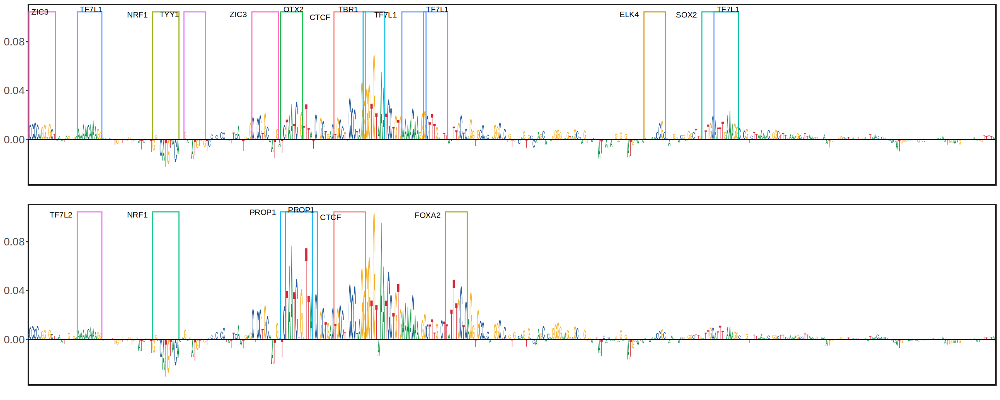

In [20]:
options(repr.plot.width = 20, repr.plot.height = 8)


# start_plot = 0
# end_plot = 1000

max(c(PS_EOi[peak,,], PS_EOd[peak,,]))
tmp1 = PS_EOi[peak,,]
rownames(tmp1) = c('A', 'C', 'G', 'T')

tmp2 = PS_EOd[peak,,]
rownames(tmp2) = c('A', 'C', 'G', 'T')

p1 = ggseqlogo(tmp1, method='custom', seq_type='dna') + ylab('my custom height') + 
            geom_rect(data = EOi_hits[peak == peak_in & hit_importance > 0.005,],
                      aes(xmin=start_rel+0.5, xmax=end_rel+0.5, ymin=0, ymax=max(c(tmp1, tmp2)),  color = name),fill=NA) + 
            ggrepel::geom_text_repel(data = EOi_hits[peak == peak_in & hit_importance > 0.005,],
                      aes(x=start_rel, y = max(c(tmp1, tmp2)), label = name)) + 
            geom_hline(yintercept = 0) +

                theme_bw() + 
                ylim(min(c(tmp1, tmp2)), max(c(tmp1, tmp2))) + 
                scale_x_continuous(expand = c(0,0), limits = c(start_plot,end_plot)) + 
                theme(panel.grid = element_blank(), 
                      panel.background = element_rect(color = 'black', fill = NA, linewidth = 1),
                      axis.text.y = element_text(size = 15),
                     axis.title.y = element_blank(),
                     axis.text.x = element_blank(),
                     axis.ticks.x = element_blank(),
                     legend.position = 'none')



p2 = ggseqlogo(tmp2, method='custom', seq_type='dna') + ylab('my custom height') + 
geom_rect(data = EOd_hits[peak == peak_in & hit_importance > 0.005,],
                      aes(xmin=start_rel+0.5, xmax=end_rel+0.5, ymin=0, ymax=max(c(tmp1, tmp2)), color = name),fill=NA) + 
            ggrepel::geom_text_repel(data = EOd_hits[peak == peak_in & hit_importance > 0.005,],
                      aes(x=start_rel, y = max(c(tmp1, tmp2)), label = name)) + 
            geom_hline(yintercept = 0) +
                theme_bw() + 
                ylim(min(c(tmp1, tmp2)), max(c(tmp1, tmp2))) + 
                scale_x_continuous(expand = c(0,0), limits = c(start_plot,end_plot)) + 
                theme(panel.grid = element_blank(), 
                      panel.background = element_rect(color = 'black', fill = NA, linewidth = 1),
                      axis.text.y = element_text(size = 15),
                     axis.title.y = element_blank(),
                     axis.text.x = element_blank(),
                     axis.ticks.x = element_blank(),
                     legend.position = 'none')

ggarrange(p1, p2, ncol = 1, align = 'hv')

In [21]:
plot_peak = function(peak_in, start_plot=350, end_plot=650, importance = 0.005){

    peak = peaks[peak == peak_in, I]
    print(peak_in)
    print(peak)
    max(c(PS_EOi[peak,,], PS_EOd[peak,,]))
    tmp1 = PS_EOi[peak,,]
    rownames(tmp1) = c('A', 'C', 'G', 'T')

    tmp2 = PS_EOd[peak,,]
    rownames(tmp2) = c('A', 'C', 'G', 'T')

    p1 = suppressWarnings(suppressMessages(ggseqlogo(tmp1, method='custom', seq_type='dna') + ylab('my custom height') + 
                geom_rect(data = EOi_hits[peak == peak_in & hit_importance > importance,],
                          aes(xmin=start_rel+0.5, xmax=end_rel+0.5, ymin=0, ymax=max(c(tmp1, tmp2)),  color = name),fill=NA) + 
                ggrepel::geom_text_repel(data = EOi_hits[peak == peak_in & hit_importance > importance,],
                          aes(x=start_rel, y = max(c(tmp1, tmp2)), label = name)) + 
                geom_hline(yintercept = 0) +

                    theme_bw() + 
                    ylim(min(c(tmp1, tmp2)), max(c(tmp1, tmp2))) + 
                    scale_x_continuous(expand = c(0,0), limits = c(start_plot,end_plot)) + 
                    theme(panel.grid = element_blank(), 
                          panel.background = element_rect(color = 'black', fill = NA, linewidth = 1),
                          axis.text.y = element_text(size = 15),
                         axis.title.y = element_blank(),
                         axis.text.x = element_blank(),
                         axis.ticks.x = element_blank(),
                         legend.position = 'none')))



    p2 = suppressWarnings(suppressMessages(ggseqlogo(tmp2, method='custom', seq_type='dna') + ylab('my custom height') + 
                geom_rect(data = EOd_hits[peak == peak_in & hit_importance > importance,],
                          aes(xmin=start_rel+0.5, xmax=end_rel+0.5, ymin=0, ymax=max(c(tmp1, tmp2)), color = name),fill=NA) + 
                ggrepel::geom_text_repel(data = EOd_hits[peak == peak_in & hit_importance > importance,],
                          aes(x=start_rel, y = max(c(tmp1, tmp2)), label = name)) + 
                geom_hline(yintercept = 0) +
                    theme_bw() + 
                    ylim(min(c(tmp1, tmp2)), max(c(tmp1, tmp2))) + 
                    scale_x_continuous(expand = c(0,0), limits = c(start_plot,end_plot)) + 
                    theme(panel.grid = element_blank(), 
                          panel.background = element_rect(color = 'black', fill = NA, linewidth = 1),
                          axis.text.y = element_text(size = 15),
                         axis.title.y = element_blank(),
                         axis.text.x = element_blank(),
                         axis.ticks.x = element_blank(),
                         legend.position = 'none')))

    plot = ggarrange(p1, p2, ncol = 1, align = 'hv')
    annotate_figure(plot, top = text_grob(peak_in, 
               color = "black", face = "bold", size = 21))
}

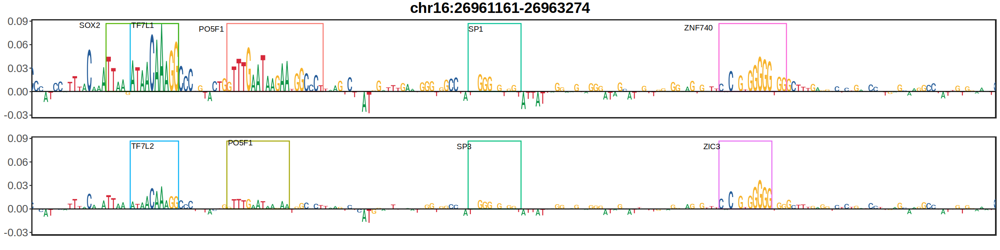

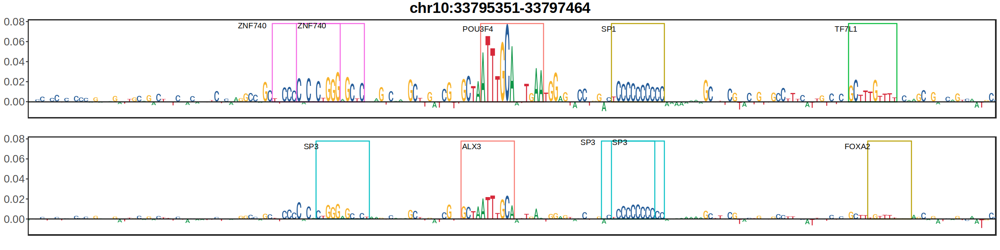

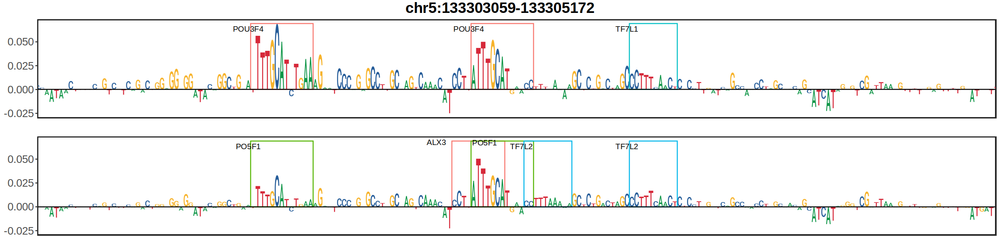

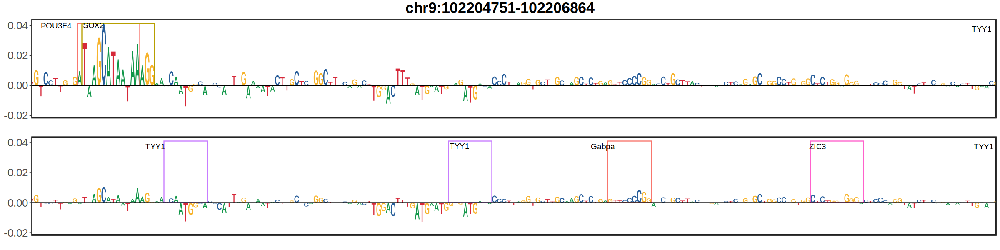

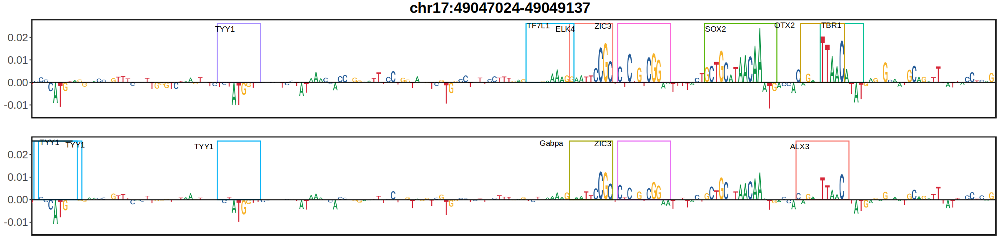

...

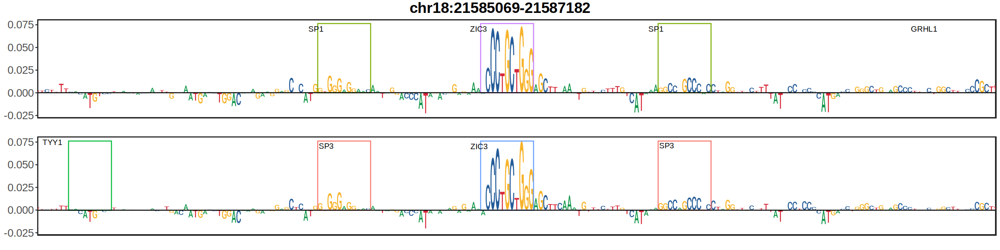

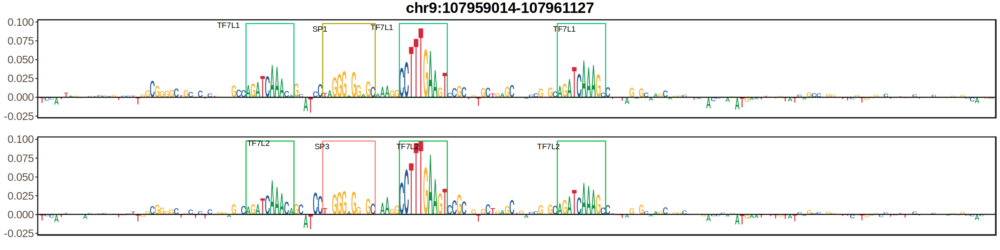

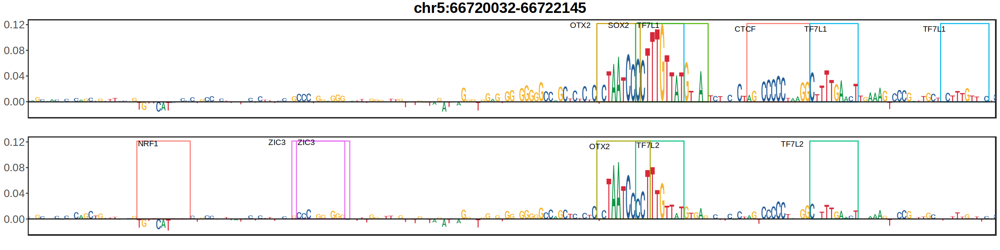

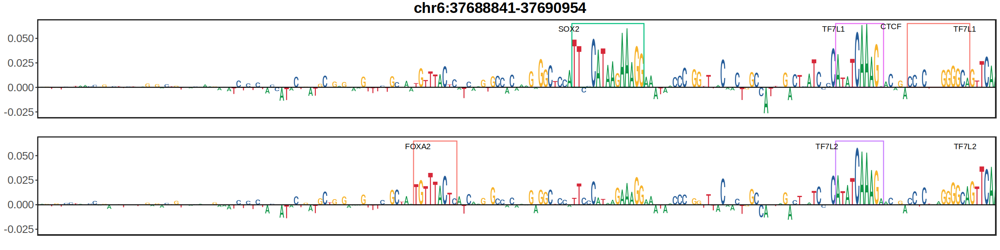

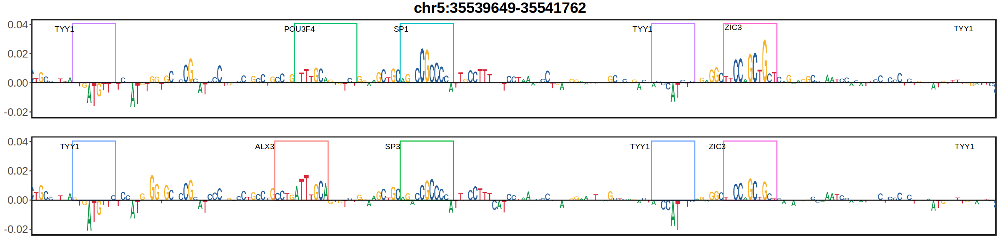

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]


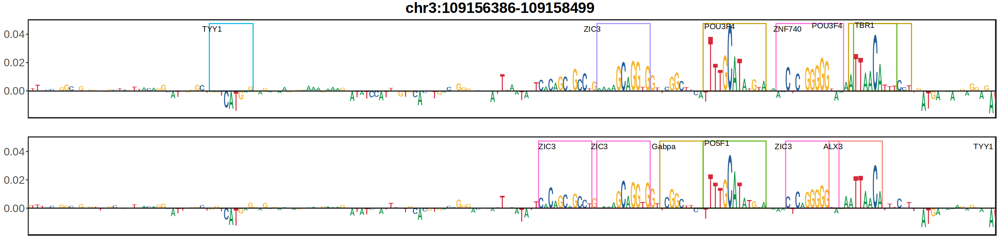

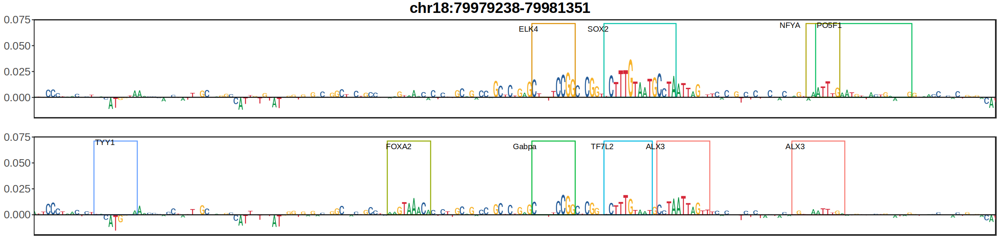

In [22]:
options(repr.plot.width = 20, repr.plot.height = 5)
mclapply(1:25, function(x){plot_peak(DARs[order(logFC)][x, peak], start_plot = 400, end_plot = 600, importance = -1)}, 
         mc.cores = 40)

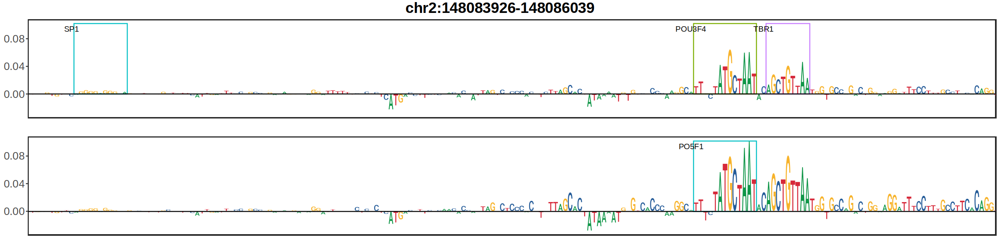

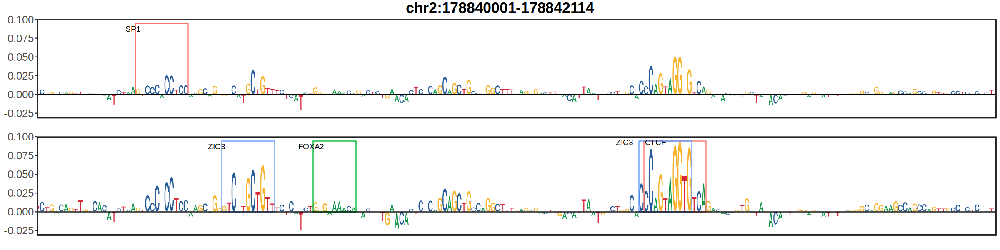

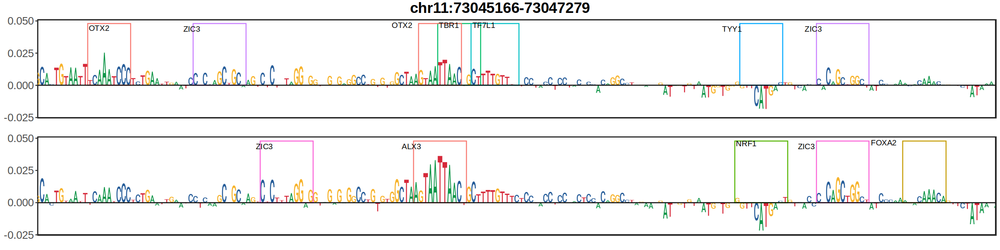

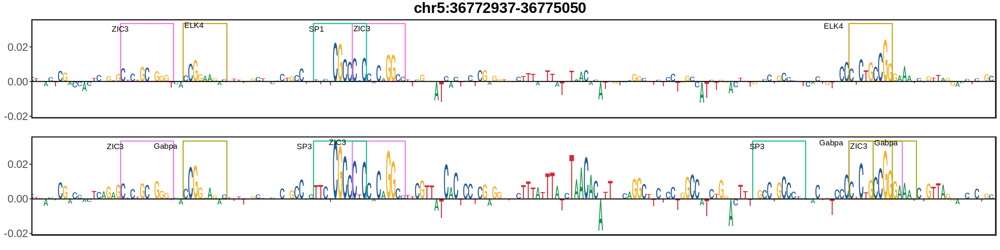

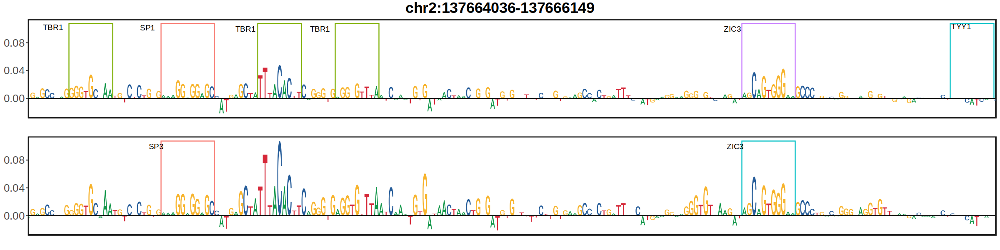

...

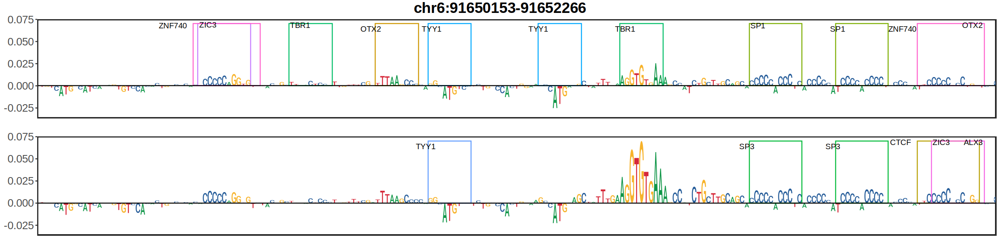

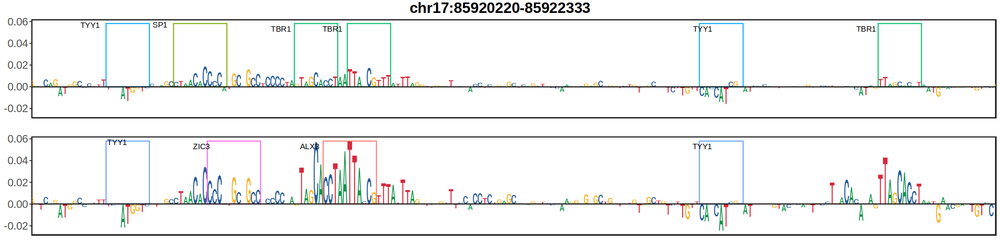

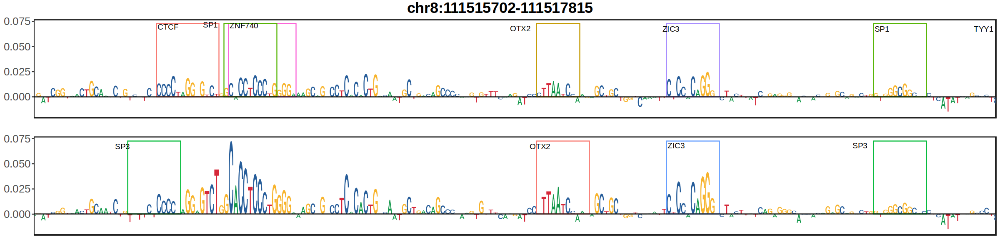

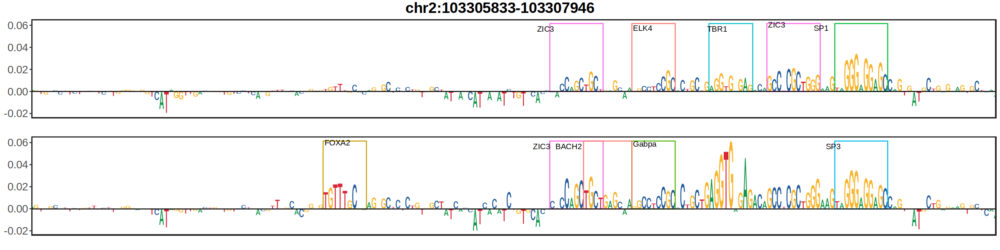

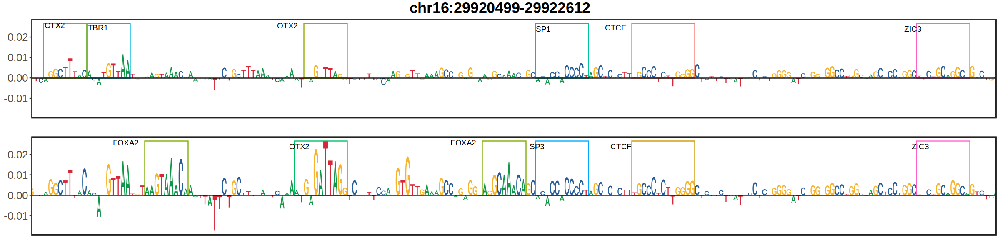

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]


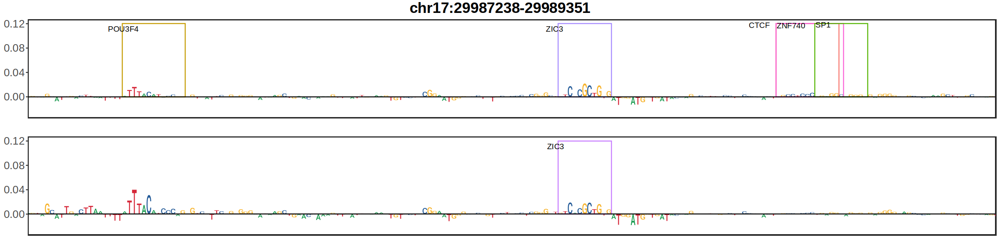

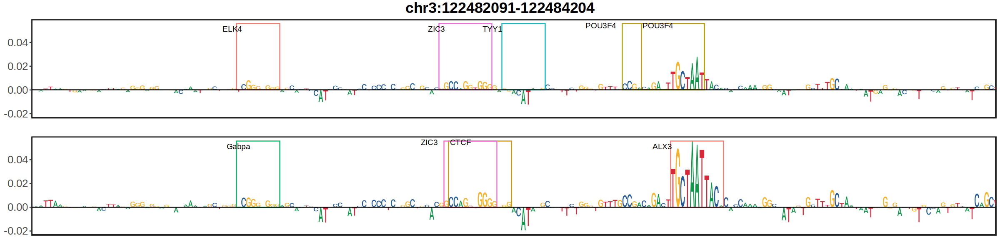

In [23]:
options(repr.plot.width = 20, repr.plot.height = 5)
mclapply(1:25, function(x){plot_peak(DARs[order(-logFC)][x, peak], start_plot = 400, end_plot = 600, importance = -1)}, 
         mc.cores = 40)

[1] "chr9:118455756-118457869"
[1] 117787


Warning message:
“Removed 6 rows containing missing values (`geom_rect()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_text_repel()`).”
Warning message:
“Removed 4 rows containing missing values (`geom_rect()`).”
Warning message:
“Removed 4 rows containing missing values (`geom_text_repel()`).”


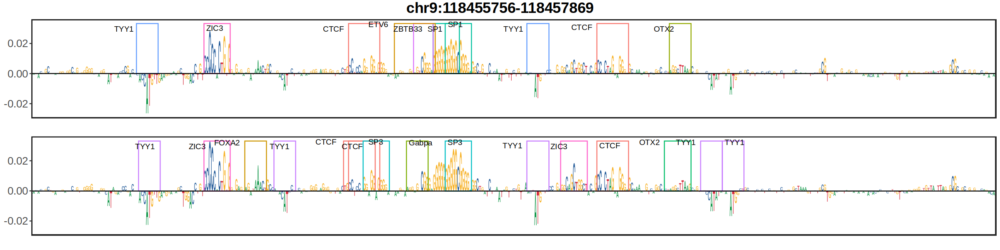

In [24]:
plot_peak('chr9:118455756-118457869', 
          start_plot = 300, end_plot = 700, importance = -1)

In [466]:
head(DARs)

gene,idx,logFC,unshrunk.logFC,logCPM,p.value,padj_fdr,sign,chr,start,end,centre,peak
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>
chr2:148084732-148085232,11803,2.187378,1.745360,179.6153,3.054552e-29,4.046783e-24,pos,chr2,148084732,148085232,148084982,chr2:148083926-148086039
chr4:127400265-127400765,8543,1.047583,3.818026,178.0698,4.555265e-29,4.046783e-24,pos,chr4,127400265,127400765,127400515,chr4:127399459-127401572
chr7:120767112-120767612,10520,1.203492,3.083993,159.7802,5.894464e-27,3.490996e-22,pos,chr7,120767112,120767612,120767362,chr7:120766306-120768419
chr17:8751083-8751583,541,1.590342,2.349122,158.5694,8.207248e-27,3.645557e-22,pos,chr17,8751083,8751583,8751333,chr17:8750277-8752390
chr1:132318024-132318524,9726,1.288590,2.609571,132.1225,1.538995e-23,5.468819e-19,pos,chr1,132318024,132318524,132318274,chr1:132317218-132319331
chr11:120939305-120939805,15860,1.092170,2.988779,122.7932,2.555954e-22,6.868750e-18,pos,chr11,120939305,120939805,120939555,chr11:120938499-120940612


In [493]:
# Eomes KD vs WT
DARs = fread(sprintf('%s/results/rna_atac/differential/v2/expression/celltype_DARs_nPS_nPS_KD_WT_edgeR.txt.gz', io$basedir))

In [485]:
# Eomes dependent vs independent WT
DARs = fread(sprintf('%s/results/rna_atac/differential/v2/expression/celltype_DARs_EOdPS_nPS_WTonly_edgeR.txt.gz', io$basedir))

In [494]:
DARs = DARs %>% 
    .[,`:=`(chr = str_split(gene, ":") %>% map_chr(1),
            start = str_split(gene, ":") %>% map_chr(2) %>% str_split(., "-") %>% map_chr(1) %>% as.numeric(),
            end = str_split(gene, ":") %>% map_chr(2) %>% str_split(., "-") %>% map_chr(2) %>% as.numeric())] %>% 
    .[, centre := start + (end-start)/2] %>%
    .[, peak := paste0(chr, ':', centre - 1056, '-', centre + 1057)] %>% 
    .[order(padj_fdr)]
DARs = DARs[!grep('chrX', peak)]

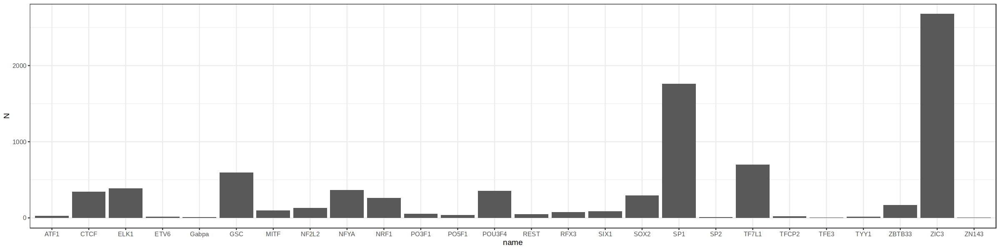

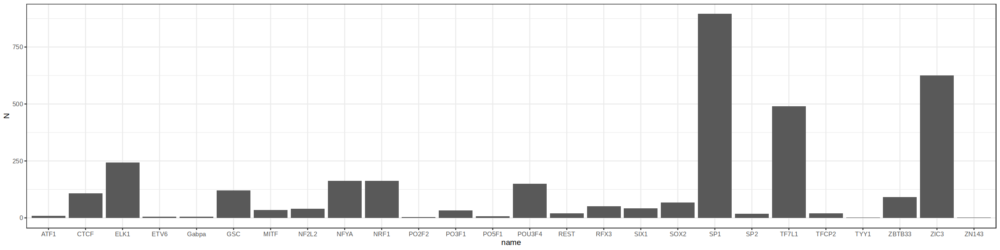

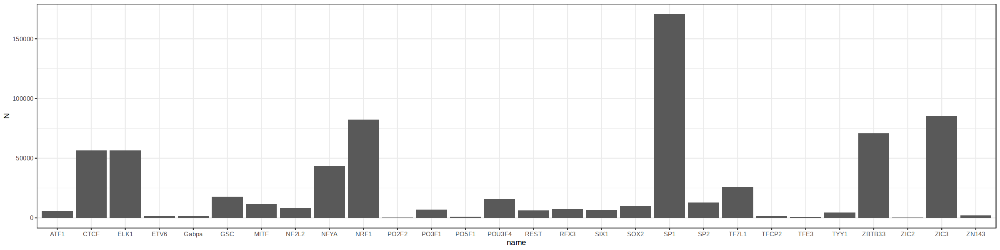

In [495]:
peaks_up = EOi_hits[peak %in% DARs[sign == 'pos', peak]][order(peak)] %>% 
    .[, N := .N, by = c('name')] %>% 
    unique(by = c('name'))

ggplot(peaks_up, aes(name, N)) + 
    geom_bar(stat = 'identity') + 
    theme_bw()

peaks_down = EOi_hits[peak %in% DARs[sign == 'neg', peak]][order(peak)] %>% 
    .[, N := .N, by = c('name')] %>% 
    unique(by = c('name'))

ggplot(peaks_down, aes(name, N)) + 
    geom_bar(stat = 'identity') + 
    theme_bw()

peaks_up = EOi_hits[peak %in% DARs[sign == 'nonsig', peak]][order(peak)] %>% 
    .[, N := .N, by = c('name')] %>% 
    unique(by = c('name'))

ggplot(peaks_up, aes(name, N)) + 
    geom_bar(stat = 'identity') + 
    theme_bw()

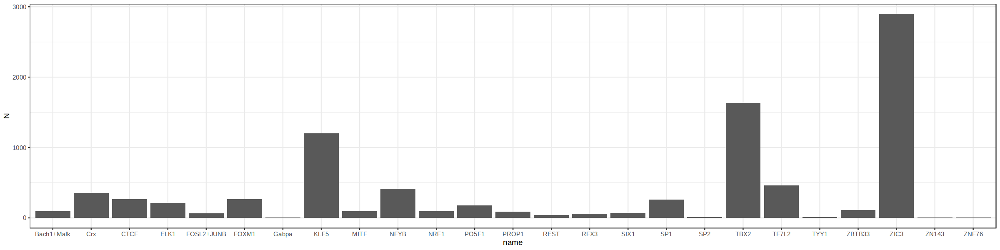

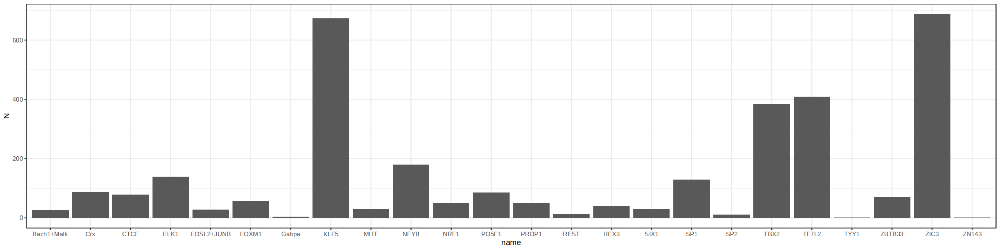

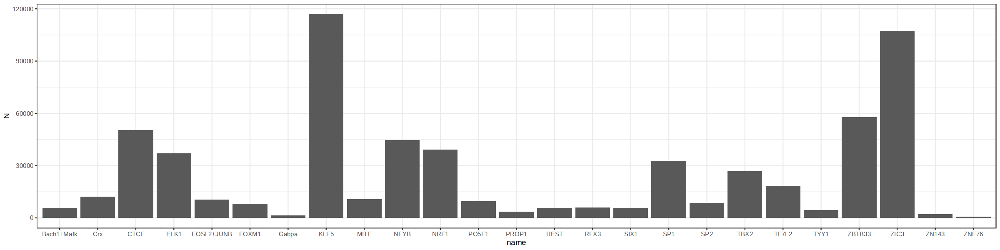

In [496]:
peaks_up = EOd_hits[peak %in% DARs[sign == 'pos', peak]][order(peak)] %>% 
    .[, N := .N, by = c('name')] %>% 
    unique(by = c('name'))

ggplot(peaks_up, aes(name, N)) + 
    geom_bar(stat = 'identity') + 
    theme_bw()

peaks_down = EOd_hits[peak %in% DARs[sign == 'neg', peak]][order(peak)] %>% 
    .[, N := .N, by = c('name')] %>% 
    unique(by = c('name'))

ggplot(peaks_down, aes(name, N)) + 
    geom_bar(stat = 'identity') + 
    theme_bw()

peaks_down = EOd_hits[peak %in% DARs[sign == 'nonsig', peak]][order(peak)] %>% 
    .[, N := .N, by = c('name')] %>% 
    unique(by = c('name'))

ggplot(peaks_down, aes(name, N)) + 
    geom_bar(stat = 'identity') + 
    theme_bw()